In [1]:
from __future__ import print_function
import time

import numpy as np
import pandas as pd

import plotly
import plotly.graph_objs as go
import plotly.express as px


from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns

np.random.seed(42)

In [2]:
X, Y = fetch_openml("mnist_784", version=1, parser='auto', return_X_y=True, as_frame=False)


In [3]:
print(type(X), print(X.shape))
print(type(Y), print(Y.shape))

(70000, 784)
<class 'numpy.ndarray'> None
(70000,)
<class 'numpy.ndarray'> None


In [4]:
print(X[0])

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   3  18  18  18 126 136 175  26 166 255
 247 127   0   0   0   0   0   0   0   0   0   0   0   0  30  36  94 154
 170 253 253 253 253 253 225 172 253 242 195  64   0   0   0   0   0   0
   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251  93  82
  82  56  39   0   0   0   0   0   0   0   0   0   0   0   0  18 219 253
 253 253 253 253 198 182 247 241   0   0   0   0   

In [5]:
X_scaled = X / 255.0
print(X_scaled[0])

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

In [6]:
n = 4
shuffle = np.random.permutation(n) 
print(np.arange(n))
print(shuffle)

[0 1 2 3]
[1 3 0 2]


In [7]:
n = X_scaled.shape[0]

shuffle = np.random.permutation(n)
print(shuffle)

[63838 63662 46034 ... 37194  6265 54886]


In [8]:
ar = np.array(["a", "b", "c", "d"])
ar_2= np.array(["e", "f", "g", "h"])
print(ar)
ar_shuffle = np.random.permutation(ar.shape[0])
print(ar_shuffle)
ar = ar[ar_shuffle]
ar_2 = ar_2[ar_shuffle]
print(ar)
print(ar_2)

['a' 'b' 'c' 'd']
[0 2 1 3]
['a' 'c' 'b' 'd']
['e' 'g' 'f' 'h']


In [9]:
X, Y = X_scaled[shuffle], Y[shuffle]

In [10]:
print(X[0])

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

In [11]:
columns = [ f'pixel{i}' for i in range(X.shape[1]) ]


df= pd.DataFrame(X, columns=columns)



df['label'] = Y

def to_int(s):
    return int(s)

df['y'] = df['label'].apply(lambda s: int(s))
df.head(5)

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,label,y
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,7
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,8
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,8
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,8
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,8


(784,)
(28, 28)


Text(0.5, 1.0, '8')

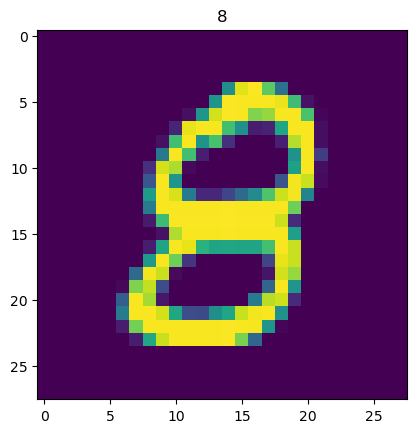

In [12]:
def reshape_number(row):
    return np.reshape(row,(28, 28))

print(X[0].shape)
print(reshape_number(X[0]).shape)

plt.imshow(reshape_number(X[4]))
plt.title(Y[4])

(10, 10)


<Figure size 640x480 with 0 Axes>

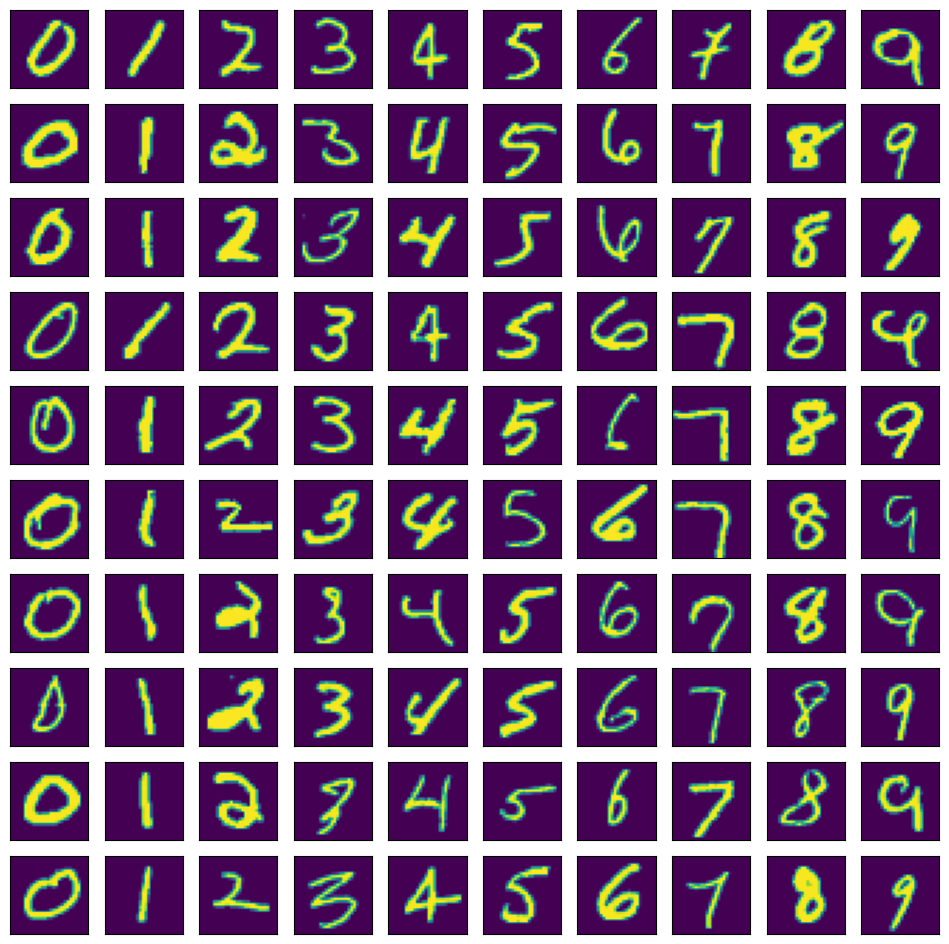

array([[  5,   6,  11,  21,  30,  31,  42,  58,  69,  77],
       [ 10,  18,  25,  32,  38,  43,  45,  60,  73,  81],
       [ 14,  39,  40,  44,  89,  90,  95,  97, 111, 142],
       [  7,  50,  55,  56,  59,  72,  74,  76,  86,  91],
       [ 29,  37,  47,  61,  70,  82,  96, 100, 101, 102],
       [ 20,  24,  26,  34,  35,  53,  54,  71, 105, 107],
       [  9,  15,  22,  28,  52,  63,  80,  92, 124, 126],
       [  0,   8,  17,  23,  27,  33,  41,  51,  57,  75],
       [  1,   2,   3,   4,  13,  19,  62,  65,  66,  68],
       [ 12,  16,  36,  46,  48,  49,  64,  67,  78,  93]])

In [13]:
def draw_numbers_grid(n, labels=Y, data=X):
    full_indices = []
    
    for digit in range(0, n):
        full_indices.append([ i for i, label in enumerate(labels) if int(label) == digit ])
        
    limited_indices = np.array([ [ el for el in row[:n] ]  for row in full_indices ]) 
    print(limited_indices.shape)
    
    figure = plt.figure()
    fig, ax = plt.subplots(n, n, figsize=(12, 12))
    
    for i, row in enumerate(limited_indices):
        for j, index in enumerate(row):
            number = data[index]
            img = reshape_number(number)
            ax[j, i].imshow(img)
            ax[j, i].set_xticks([])
            ax[j, i].set_yticks([])
    
    plt.show()
    
    return limited_indices
draw_numbers_grid(10)   

In [14]:
pca = PCA(n_components=2)

pca_results = pca.fit_transform(df[columns].values)

print(pca.explained_variance_ratio_)

[0.09746116 0.07155445]


In [15]:
df['pca-one'] = pca_results[:, 0]
df['pca-two'] = pca_results[:, 1]

<Axes: xlabel='pca-one', ylabel='pca-two'>

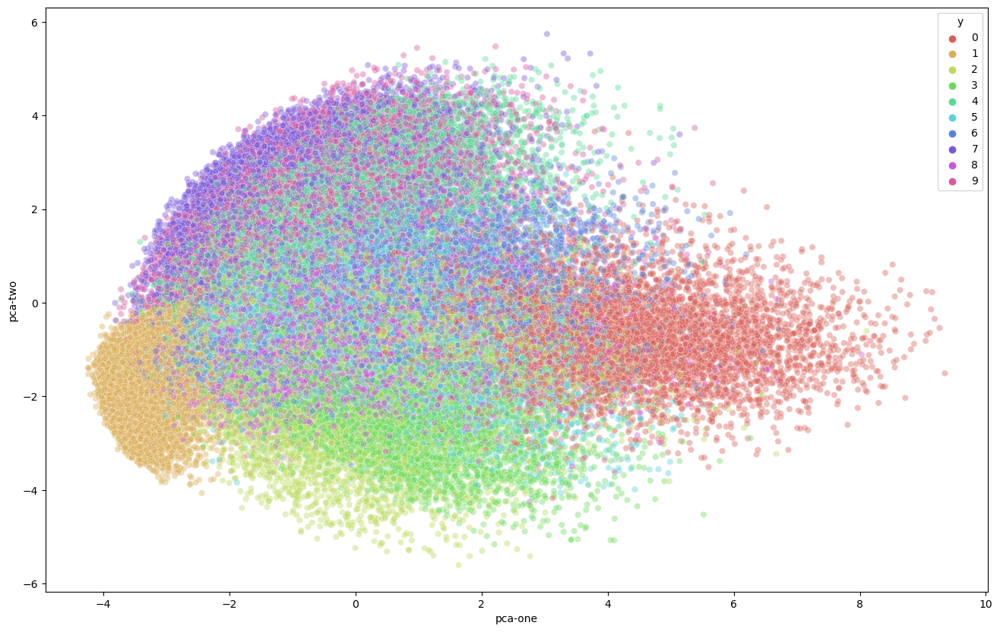

In [16]:
plt.figure(figsize=(16, 10))
sns.scatterplot(
    data=df,
    x='pca-one',
    y='pca-two',
    hue='y',
    legend="full",
    alpha=0.4,
    palette=sns.color_palette("hls", 10)
)

In [17]:
pca = PCA(n_components=3)

pca_results = pca.fit_transform(df[columns].values)

print(pca.explained_variance_ratio_)

df['pca-one'] = pca_results[:, 0]
df['pca-two'] = pca_results[:, 1]
df['pca-three'] = pca_results[:, 2]

[0.09746116 0.07155445 0.06149531]


In [18]:
fig = px.scatter_3d(df, x="pca-one", y="pca-two", z="pca-three", color="y")

fig.update_traces(marker={"size": 1})
fig.show()

In [19]:
time_start = time.time()

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    
tsne_results = tsne.fit_transform(df)
    
print(f"Seconds elapsed: {time.time() - time_start }")
    

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.106s...
[t-SNE] Computed neighbors for 70000 samples in 44.629s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for s

In [20]:
df['tsne-2d-one'] = tsne_results[:, 0]
df['tsne-2d-two'] = tsne_results[:, 1]

/var/folders/4w/wsg2dmm97xs_jd036pmhsf2m0000gn/T/ipykernel_64915/2951301366.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

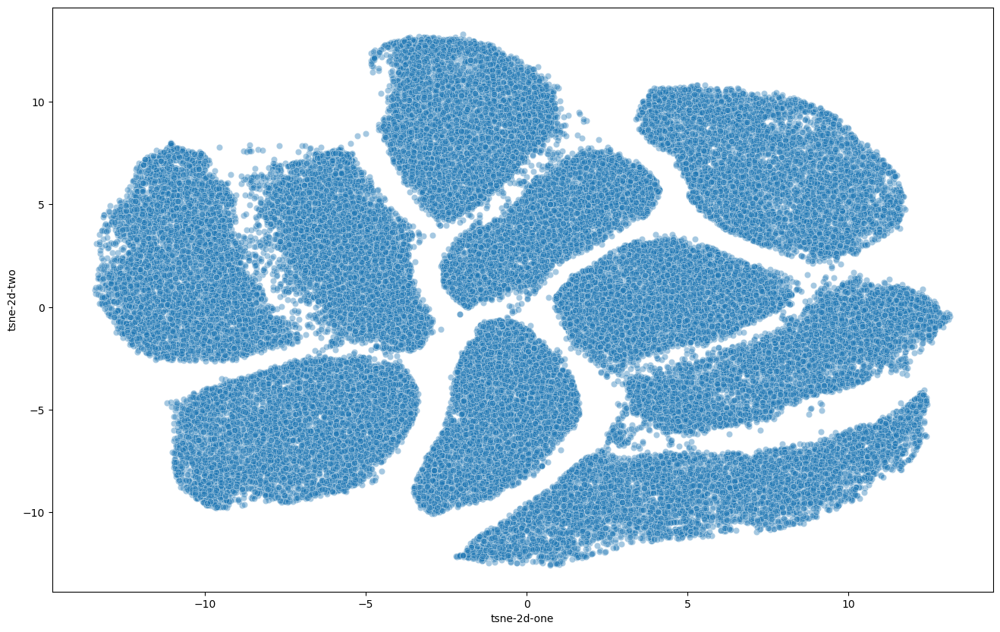

In [21]:
plt.figure(figsize=(16, 10))
sns.scatterplot(
    data=df,
    x='tsne-2d-one',
    y='tsne-2d-two',
    #hue='y',
    legend="full",
    alpha=0.4,
    palette=sns.color_palette("hls", 10)
)

In [ ]:
N = 10000
pca_50 = PCA(n_components=50)

subset =df[columns].values[:N]

pca_results_50 = pca_50.fit_transform(subset)

#pca_results_50 = pca_50.fit_transform(df[columns].values)

print(pca_50.explained_variance_ratio_)

In [23]:
print(np.sum(pca_50.explained_variance_ratio_))

0.8253907665015839


In [31]:
time_start = time.time()

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
   
#tsne_results = tsne.fit_transform(subset)

    
tsne_results = tsne.fit_transform(pca_results_50)

    
print(f"Seconds elapsed: { time.time() - time_start }")
    

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.007s...
[t-SNE] Computed neighbors for 70000 samples in 4.051s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for sa

In [32]:
df_subset = df.head(N)
df_subset.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel781,pixel782,pixel783,label,y,pca-one,pca-two,pca-three,tsne-2d-one,tsne-2d-two
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,7,7,-2.705484,-1.008190,0.927850,-6.680438,-2.614944
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8,8,2.402809,-1.085374,3.553509,-3.051976,-0.079748
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8,8,0.937643,2.244696,1.943821,-6.933601,0.422242
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8,8,-0.585086,-0.575630,1.148648,-5.304197,1.148187
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8,8,2.532218,-1.007155,-0.624315,-4.381844,4.634332


In [35]:
df['tsne-pca50-one'] = tsne_results[:, 0]
df['tsne-pca50-two'] = tsne_results[:, 1]

In [36]:
df_subset = df.head(N)
df_subset.head(N)


,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel783,label,y,pca-one,pca-two,pca-three,tsne-2d-one,tsne-2d-two,tsne-pca50-one,tsne-pca50-two
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,7,7,-2.705484,-1.008190,0.927850,-6.680438,-2.614944,-7.987258,-4.617740
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8,8,2.402809,-1.085374,3.553509,-3.051976,-0.079748,3.463325,-4.689470
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8,8,0.937643,2.244696,1.943821,-6.933601,0.422242,-0.002062,1.089465
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8,8,-0.585086,-0.575630,1.148648,-5.304197,1.148187,-1.279768,-1.206222
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8,8,2.532218,-1.007155,-0.624315,-4.381844,4.634332,0.692470,-3.739536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,6,6,-2.457677,-1.334771,2.525605,-1.705024,5.174057,4.987473,3.165879
9996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,6,6,2.139019,1.473553,1.657821,-2.111521,10.402782,8.690150,5.444854
9997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,5,5,1.478246,-2.105341,3.185861,0.225733,6.120199,5.864086,-1.066586
9998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1,1,-3.928506,-1.473865,0.287936,3.229073,-9.605874,-9.349760,-0.756429


<Axes: xlabel='tsne-pca50-one', ylabel='tsne-pca50-two'>

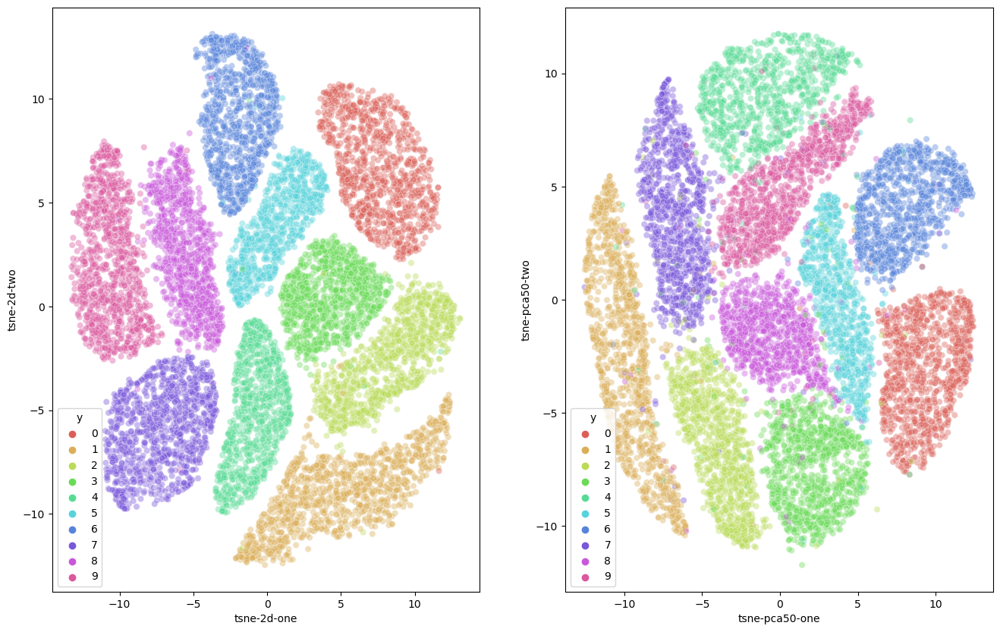

In [37]:
plt.figure(figsize=(16, 10))

ax1 = plt.subplot(1, 2, 1)

sns.scatterplot(
    x="tsne-2d-one",
    y="tsne-2d-two",
    data=df_subset,
    hue='y',
    legend="full",
    alpha=0.4,
    palette=sns.color_palette("hls", 10),
    
)

ax2 = plt.subplot(1, 2, 2)

sns.scatterplot(
    x="tsne-pca50-one",
    y="tsne-pca50-two",
    data=df_subset,
    hue='y',
    legend="full",
    alpha=0.4,
    palette=sns.color_palette("hls", 10),
    
)    

In [ ]:
plt.figure(figsize=(16,7))

ax1 = plt.subplot(1, 2, 1)
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax1
)

ax2 = plt.subplot(1, 2, 2)
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax2
)
